# London PM2.5 Data Simulation

In [1]:
# ! pip install pyrosm
# ! pip install haversine

In [28]:
import geopandas as gpd
import pandas as pd
import glob
import os
import matplotlib.pyplot as plt
import networkx as nx
import requests
import pyrosm
import osmnx as ox
import random
import csv
import pickle
import numpy as np
import math
import datetime as dt
from haversine import haversine, Unit
from shapely.geometry import Point, box
from tqdm import tqdm
tqdm.pandas()

#### Load background measurements

In [4]:
def load_background():
    """
    Fetch dataframe of ambient PM2.5 measurements in London

    Output:
    frame: dataframe of London measurements
    """
    path = r'C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\Monitoring Station Data'
    all_files = glob.glob(os.path.join(path, "*.csv"))

    li = []

    for filename in all_files:
        df = pd.read_csv(filename, index_col=None, header=0)
        li.append(df)

    frame = pd.concat(li, axis=0, ignore_index=True)

    frame.rename(columns={"Site":"SiteCode"}, inplace=True)

    site_tups = [("BX9", "Bexley - Slade Green FDMS", "Suburban")
        , ("BL0","Camden - Bloomsbury", "Urban Background")
        , ("CD1", "Camden - Swiss Cottage", "Kerbside")
        , ("CT2", "City of London - Farringdon Street", "Kerbside")
        , ("CT3", "City of London - Sir John Cass School", "Urban Background")
        , ("CR8", "Croydon - Norbury Manor", "Urban Background")
        , ("GN0", "Greenwich - A206 Burrage Grove", "Roadside")
        , ("GR4", "Greenwich - Eltham", "Suburban")
        , ("GB0", "Greenwich - Falconwood FDMS", "Roadside")
        , ("GN6", "Greenwich - John Harrison Way", "Roadside")
        , ("GN3", "Greenwich - Plumstead High Street", "Roadside")
        , ("GR9", "Greenwich - Westhorne Avenue", "Roadside")
        , ("HV1", "Havering - Rainham", "Roadside")
        , ("LH0", "Hillingdon - Harlington", "Urban Background")
        , ("KC1", "Kensington and Chelsea - North Ken", "Urban Background")
        , ("KF1", "Kensington and Chelsea - North Ken FIDAS", "Urban Background")
        , ("HP1", "Lewisham - Honor Oak Park", "Urban Background")
        , ("LW2", "Lewisham - New Cross", "Roadside")
        , ("TD5", "London Teddington Bushy Park", "Suburban")
        , ("MR8", "Marylebone Road - WIBS", "Kerbside")
        , ("RD0", "Reading AURN - New Town", "Urban Background")
        , ("RB7", "Redbridge - Ley Street", "Urban Background")
        , ("ST5", "Sutton - Beddington Lane", "Industrial")
        , ("TK3", "Thurrock - Stanford-le-Hope", "Roadside")
        , ("TH4", "Tower Hamlets - Blackwall", "Roadside")
        , ("WM0", "Westminster - Horseferry Road", "Urban Background")
        , ("MY7", "Westminster - Marylebone Road FDMS", "Kerbside")]
    
    sites = {}
    profiles = {}

    for site_code, site, profile in site_tups:
        sites[site_code] = site
        profiles[site_code] = profile

    frame["Site"] = frame["SiteCode"].map(sites)
    frame["Profile"] = frame["SiteCode"].map(profiles)
    
    frame["ReadingDateTime"] = pd.to_datetime(frame["ReadingDateTime"], format=r"%d/%m/%Y %H:%M")

    return frame

In [ ]:
frame = load_background()

#### Simulating on-road trajectories

The main idea is as follows:
* We simulate 1000 random pairs of points on the road network
* For each pair of points (x1,y1), (x2,y2), we find the shortest on-road path between them
* We then extract the sequence of coordinates for all 1000 pairs

Load road network data directly from OSM:

In [27]:
# extract bounding box from QGIS area
output_file = r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\Final_Roads_Small"
gdf_cut = gpd.read_file(output_file)
gdf_lat_lon = gdf_cut.to_crs('epsg:4326')
min_x, min_y, max_x, max_y = gdf_lat_lon.total_bounds

In [17]:
# get nodes and edges in bounding box
bounding_box=[min_x, min_y, max_x, max_y]
pbf_path="auto"
osm = pyrosm.OSM(pyrosm.get_data("London"), bounding_box=bounding_box)

# retrieve all highway types; we will manually filter to roads
nodes, edges = osm.get_network(network_type="all", nodes=True)

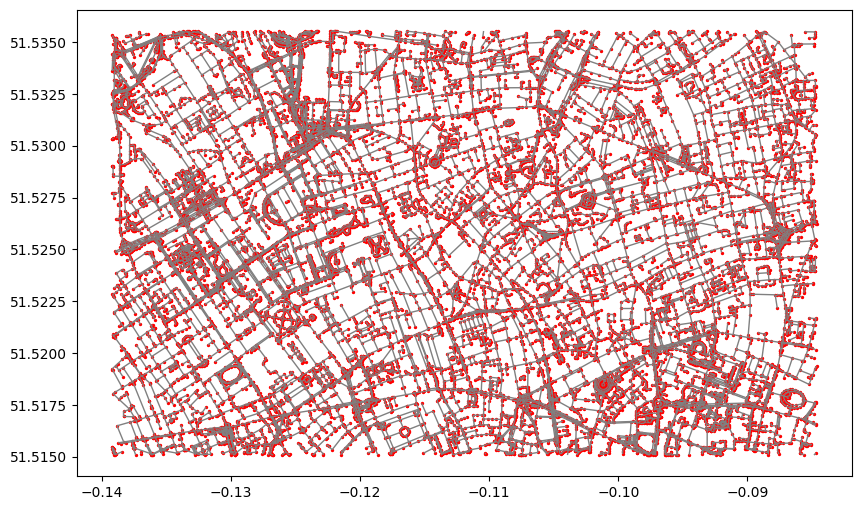

In [38]:
# plot
ax = edges.plot(figsize=(10,10), color="gray", lw=1.0)
ax = nodes.plot(ax=ax, color="red", markersize=2)

Beautiful!

#### Filter road types

<Axes: >

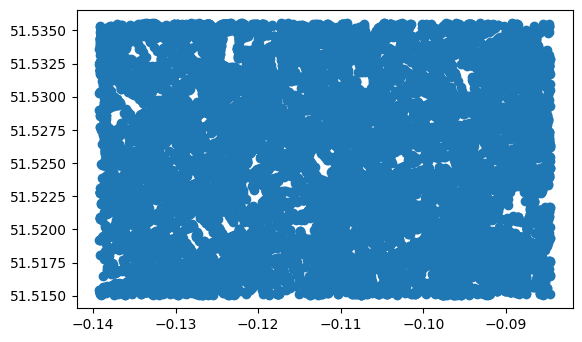

In [42]:
nodes.plot()

In [20]:
G = osm.to_graph(nodes, edges, graph_type="networkx").to_undirected()
G

c:\Users\nial\anaconda3\envs\Statslab\Lib\site-packages\pyrosm\graphs.py:155: UserWarning: Column 'oneway' missing in the edges GeoDataFrame. Assuming all edges to be bidirectional (travel allowed to both directions).
  nodes, edges = get_directed_edges(


Save the graph

In [30]:
graph_path = r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\london_graph.pkl"

# with open(graph_path, 'wb') as f:
#    pickle.dump(G,f)

with open(graph_path, 'rb') as f:
    G = pickle.load(f)

output_nodes = r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\london_nodes.gpkg"
output_edges = r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\london_edges.gpkg"

nodes = gpd.read_file(output_nodes)
edges = gpd.read_file(output_edges)

roads = ["primary", "unclassified", "residential"
         , "road", "tertiary", "secondary"
         , "primary_link", "secondary_link"
         , "trunk", "trunk_link", "service"]

edges = edges[edges["highway"].isin(roads)]

# select columns
ncols_to_keep = ["id","lon", "lat", "tags", "geometry"]
ecols_to_keep = ["id", "tags","geometry", "u", "v", "length", "name", "highway"]

nodes = nodes[ncols_to_keep]
edges = edges[ecols_to_keep]

In [23]:
# the save appears to have worked
# ox.plot_graph_folium(G_loaded)
ox.plot_graph_folium(G)

C:\Users\nial\AppData\Local\Temp\ipykernel_3092\1713032392.py:1: FutureWarning: The `folium` module has been deprecated and will be removed in the v2.0.0 release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  ox.plot_graph_folium(G_loaded)


Wonderful! Now we can compute the shortest path between two random nodes. The next step is to compute 10,000 random trajectories this way...

Trajectories are sequences of node IDs. Let's keep it that way for now, we can map those to coordinates later if needed.

In [54]:
def simulate_trajectories(G, num_traj=100, plot=False):
    """
    input
    G: a networkx.classes.graph.Graph object
    num_traj: integer, # of trajectories to simulate
    plot: Boolean, whether to plot the simulated paths (to ensure coverage)
    Plotting is NOT recommended for n large (e.g., n>100)

    output
    trajectories: a list of simulated trajectories
    """

    n_sim = 0
    trajectories = list()
    node_list = list(G.nodes())

    while n_sim < num_traj:

        # pick distinct nodes at random
        origin = random.choice(node_list)
        destination = random.choice([n for n in node_list if n != origin])
        
        try:
            # compute shortest (distance) path
            metric_path = nx.dijkstra_path(G, source=origin, target=destination, weight='length')
        
            #save
            trajectories.append(metric_path)
            n_sim += 1

        except nx.NetworkXNoPath:
            print("No path between nodes")
            pass
    
    if plot:
        fig, ax = ox.plot_graph_routes(G, trajectories)

    return trajectories

In [59]:
# trajectories = simulate_trajectories(G, num_traj=10000,plot=False)

trajectories_outfile = r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\trajectories_improved.csv"

with open(trajectories_outfile, "w") as f:
    wr = csv.writer(f)
    wr.writerows(trajectories)

Read in the stored trajectories data

In [145]:
trajectories_outfile = r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\trajectories_improved.csv"

with open(trajectories_outfile, 'r') as file:
    csv_reader = csv.reader(file) 
    list_of_csv = list(csv_reader) 

list_of_csv = list_of_csv[::2]
trajectories = [[int(num) for num in row] for row in list_of_csv]

### Temporal simulation

We want a dataframe with the hourly average (median) PM2.5 in September 2019 to illustrate the temporal trend: 

In [137]:
# frame = load_background()
filtered_frame = frame[(frame['ReadingDateTime'].dt.year == 2019)\
                        & (frame['ReadingDateTime'].dt.month == 9) \
                        & (frame['Profile'] == 'Roadside') \
                        & (frame['Provisional or Ratified'] == 'R')]

# extract median PM2.5 per hour in September
hourly_medians = filtered_frame.groupby([filtered_frame['ReadingDateTime'].dt.date\
    ,filtered_frame['ReadingDateTime'].dt.hour])\
    ['Value'].median().reset_index(1).rename(columns={'ReadingDateTime':'Hour'})\
    .reset_index().rename(columns={'ReadingDateTime':'Date'})

In [138]:
hourly_medians.head()

,Date,Hour,Value
0,2019-09-01,0,5.5
1,2019-09-01,1,5.0
2,2019-09-01,2,3.5
3,2019-09-01,3,6.5
4,2019-09-01,4,5.8


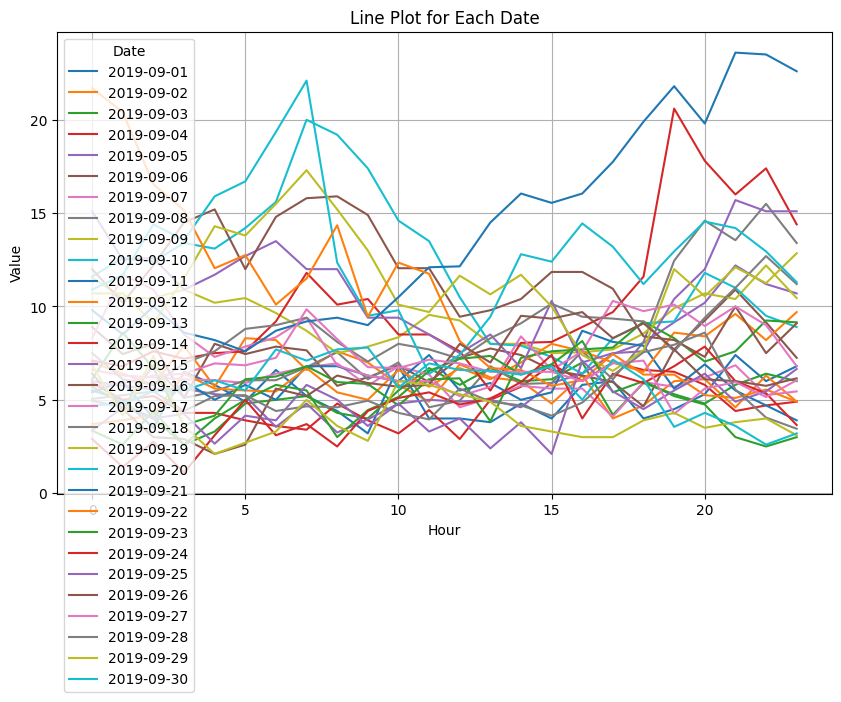

In [140]:
pivot_df = hourly_medians.pivot(index='Date', columns='Hour', values='Value')

# Plotting the line plot
plt.figure(figsize=(10, 6))
for date, values in pivot_df.iterrows():
    plt.plot(values.index, values.values, label=str(date))

plt.xlabel('Hour')
plt.ylabel('Value')
plt.title('Line Plot for Each Date')
plt.legend(title='Date', loc='upper left')
plt.grid(True)
plt.show()

Finally, we want to relativise this dataframe. Compute each median as a proportion of the overall median for September 2019.

In [142]:
overall_median = filtered_frame["Value"].median()
overall_median

7.0

In [12]:
# hourly_multipliers = hourly_medians
# hourly_multipliers['Multiplier'] = hourly_multipliers['Value'] / overall_median
hourly_multipliers.head()

,Date,Hour,Value,Multiplier
0,2019-09-01,0,5.5,0.785714
1,2019-09-01,1,5.0,0.714286
2,2019-09-01,2,3.5,0.500000
3,2019-09-01,3,6.5,0.928571
4,2019-09-01,4,5.8,0.828571


For posterity:

In [144]:
hourly_multipliers.to_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\hourly_multipliers.csv", index=False)

In [73]:
hourly_multipliers = pd.read_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\hourly_multipliers.csv")
hourly_multipliers.drop(hourly_multipliers.columns[0], axis=1, inplace=True)

#### Sampling process

For each trajectory do:

    * Convert into a list of (uniformly-spatially-spaced) coordinates <- this is what we do now
    * Assign times to each trajectory
    For each coordinate do:
    
        * Sample the PM2.5 value from nearest grid square
        * Apply hourly correction
        * Apply (Gaussian?) noise
        * Apply skewed noise

Find the point 10m along a trajectory:

* Compute length of each edge (this could be retrieved from the edge dataframe)
* Proceed along the edge lengths, finding the one in which the 10m point is passed
* Interpolate between the coordinates of the adjacent nodes

We need a function to convert a node id into coordinates, in order to use the generated trajectories:

In [127]:
def coords_from_node(G, node_id):
    """
    Returns the (lat,lon) coordinates of a node in G 
    Input:
    G: graph
    node_id: node

    Output:
    coords: (lat,lon) tuple
    """
    lat = G.nodes[node_id]['y']
    lon = G.nodes[node_id]['x']

    return (lat,lon)

A function to retrieve the edge lengths along a single trajectory

In [126]:
def get_edge_lengths(trajectory, edges):
    """
    Retrieve edge lengths for a trajectory through G
    Input:
    trajectory: list of node IDs in G
    edges: geodf of edges in G

    Output:
    edge_lengths: df with edge, length, cum_length
    """
    t_edges = [(trajectory[i], trajectory[i+1]) for i in range(len(trajectory) - 1)]
    t_lengths = []

    # graph is bidirectional
    for u, v in t_edges:
        length = edges[(edges['u'] == u) & (edges['v'] == v)]['length'].values.tolist()
        if not length:
            length = edges[(edges['u'] == v) & (edges['v'] == u)]['length'].values.tolist()

        t_lengths.append(length[0])
    
    t_cum_lengths = np.cumsum(t_lengths)

    edge_df = pd.DataFrame(t_edges, columns=['u', 'v'])
    length_df = pd.DataFrame({'length':t_lengths, 'cumulative length':t_cum_lengths})

    edge_lengths = pd.concat([edge_df, length_df], axis=1)
    return edge_lengths

A function to determine the edges at which we sample and how far along them we sample

In [125]:
def get_edges_to_sample(edge_lengths):
    """
    Compute sequence of edges to sample, and how far along each we should sample
    Inputs:
    edge_lengths: output from get_edge_lengths()

    Outputs:
    edges_to_sample: df of edge to sample, distance along, cumulative distance, ...
    """
    traj_length = edge_lengths['cumulative length'].iloc[-1]
    num_samples = math.floor(traj_length / 8.33)

    # distances along path at which we will sample
    sample_dists = [round(i * 8.33,2) for i in range(1, num_samples + 1)]

    # identify edges corresponding to sample points
    bins = np.concatenate(([0], edge_lengths['cumulative length'].values))
    edge_indices = pd.cut(sample_dists, bins=bins, labels=False, include_lowest=True)

    # get length along edges of sample points
    length_along = [s - (edge_lengths['cumulative length'].iloc[edge_indices[i] - 1] if edge_indices[i]>0 else 0) for (i,s) in enumerate(sample_dists)]
    length_along = [round(l,2) for l in length_along]    

    # return
    edges_to_sample = pd.DataFrame({'Edge indices':edge_indices
                                    ,'Sample distance':sample_dists 
                                    ,'Distance along edge':length_along})
    
    edges_to_sample['u'] = edge_lengths.loc[edge_indices]['u'].values
    edges_to_sample['v'] = edge_lengths.loc[edge_indices]['v'].values
    edges_to_sample['length'] = edge_lengths.loc[edge_indices]['length'].values

    return edges_to_sample


In [124]:
def interpolate_nodes(nodes, node1, node2, distance_along, edge_length):
    """
    Compute point between two nodes.
    Inputs:
    nodes: df of graph nodes
    node1: ID of first node
    node2: ID of second node
    distance: # of meters from node1
    edge_length: total length of edge between nodes
    
    Outputs:
    inter_lat, inter_lon: coordinates of interpolated point
    """
    # check distance_along is valid
    frac = distance_along / edge_length
    if frac > 1.1 or frac < 0: raise ValueError("Invalid distance / edge length combination. \n \
                                              Frac: {}. Distance: {}. Edge length:{}".format(frac, distance_along, edge_length))

    n1_lat, n1_lon = nodes[nodes["id"] == node1]["lat"].iloc[0], nodes[nodes["id"] == node1]["lon"].iloc[0] 
    n2_lat, n2_lon = nodes[nodes["id"] == node2]["lat"].iloc[0], nodes[nodes["id"] == node2]["lon"].iloc[0] 

    inter_lat = n1_lat + (n2_lat - n1_lat)*frac
    inter_lon = n1_lon + (n2_lon - n1_lon)*frac

    return inter_lat, inter_lon

In [123]:
def coords_from_trajectory(trajectory, edges, nodes):
    """
    Convert a trajectory into a sequence of coords along it

    Inputs:
    trajectory: list of node IDs
    edges: edges DF for G
    nodes: nodes DF for G

    Outputs:
    coords: list of uniformly-spatially-spaced coordinate tuples
    """
    edge_lengths = get_edge_lengths(trajectory,edges)
    edges_to_sample = get_edges_to_sample(edge_lengths) 
    coords = edges_to_sample.apply(lambda row: interpolate_nodes(nodes, row['u'], row['v'], row['Distance along edge'], row['length']), axis=1).values.tolist()
    return coords

In [122]:
def coords_from_trajectories(trajectories, edges, nodes):
    """
    Convert a list of trajectories into a list of coordinate sequences

    Inputs:
    trajectories: output of simulate_trajectories()
    edges: G graph edges
    nodes: G graph nodes

    Outputs:
    coords: list of coordinate sequences
    """
    # all_coords = []
    # for i,t in enumerate(trajectories):
    #    try: coords = coords_from_trajectory(t, edges, nodes)
    #    except ValueError: print(f"Failed at trajectory {i}")
    #    all_coords.append(coords)

    return [coords_from_trajectory(t, edges, nodes) for t in trajectories]

In [146]:
coords = coords_from_trajectories(trajectories,edges,nodes)

For posterity

In [147]:
with open(coords_file, 'wb') as f:
    pickle.dump(coords, f)

In [4]:
coords_file = r'C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\coords.pkl'

with open(coords_file, 'rb') as f:
    coords = pickle.load(f)

In [5]:
lats = [lat for sublist in coords for (lat, lon) in sublist]
lons = [lon for sublist in coords for (lat, lon) in sublist]

In [6]:
coords_df = pd.DataFrame({'lat':lats, 'lon':lons})
coords_df.head()

,lat,lon
0,51.531608,-0.111227
1,51.531541,-0.111197
2,51.531469,-0.111169
3,51.531397,-0.111135
4,51.531324,-0.111104


In [8]:
coords_df.head(2000).to_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\coords_df.csv")

Let's check that the method has worked:

Trajectory 12


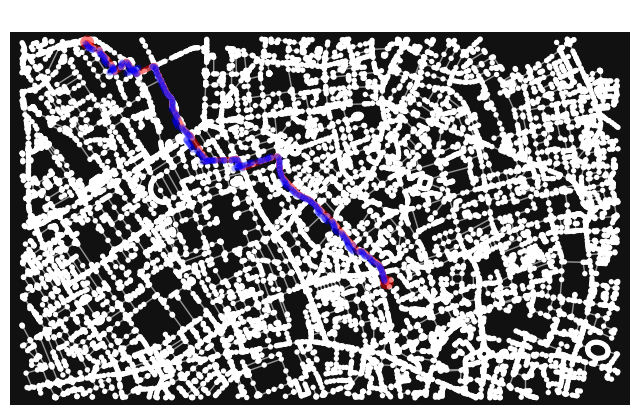

In [48]:
j = random.randint(0,100)
trajectory = trajectories[j]
print(f"Trajectory {j}")

# superimpose the trajectory
G_temp = nx.Graph()
coord_sequence = coords[j]

for i, point in enumerate(coord_sequence):
    G_temp.add_node(i, pos=point)

for i in range(len(coord_sequence) - 1):
    G_temp.add_edge(i, i + 1)

fig, ax = ox.plot_graph_route(G,trajectory, show=False, close=False)

# Plot the route on the same axis
x, y = zip(*[point[::-1] for point in coord_sequence])  # Reverse latitudes and longitudes
ax.scatter(x, y, color='blue', marker='o', zorder=5, alpha=0.2, s=15)

# Show the plot
plt.title('Random trajectory (red) and sample points along (blue)', color='white')
plt.show()

Looks good!

#### Temporal Dimension

We now have 10,000 trajectories for the drivers. Next, we will assign a random start time to each trajectory.

In [10]:
def get_random_time(start_time, end_time):
    """
    Returns a random time in a specified interval

    Inputs:
    start_time: start datetime
    end_time: end datetime

    Outputs: 
    random_time: random date_time
    """
    time_diff = end_time - start_time
    delta = random.random() * time_diff.total_seconds()

    random_time = start_time + dt.timedelta(seconds=delta)
    random_time = pd.to_datetime(random_time).round('1s')

    return random_time

In [11]:
def get_start_times(coords
                    , start_time=dt.datetime(2019, 9, 1, 0, 0, 0)
                    , end_time=dt.datetime(2019, 10, 1, 0, 0, 0)):
    """
    Assign a random start time in specified interval to each coord sequence

    Inputs:
    coords: list of coord sequences

    Outputs:
    start_times: list of random start times
    """
    start_times = [get_random_time(start_time, end_time) for c in coords]
    return start_times

In [12]:
start_times = get_start_times(coords)

Now we have a function to get random start times. Next, we want to generate times for every coordinate measurement.

In [13]:
def get_all_times(coords, start_times):
    """
    Assign a datetime to every coord sampled.

    Input:
    coords: list of coordinate tuples
    start_times: list of start datetimes (at which measurement commenced)
    
    Output:
    all_times: dataframe of lat, lon, coordinate, time
    """
    tuples = []

    for i,c in enumerate(coords):
        start_time = start_times[i]
        for j, (lat, lon) in enumerate(c):
            time = start_time + dt.timedelta(seconds=j)
            tuples.append((lat, lon, time))
    
    all_times = pd.DataFrame(tuples, columns=['lat','lon','time'])
    return all_times

In [14]:
all_times = get_all_times(coords, start_times)

In [15]:
all_times.head()

,lat,lon,time
0,51.531608,-0.111227,2019-09-20 00:40:46
1,51.531541,-0.111197,2019-09-20 00:40:47
2,51.531469,-0.111169,2019-09-20 00:40:48
3,51.531397,-0.111135,2019-09-20 00:40:49
4,51.531324,-0.111104,2019-09-20 00:40:50


In [16]:
max(all_times['time'])

Timestamp('2019-09-30 23:57:52')

Save / reload the all_times data

In [17]:
all_times.to_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\all_times.csv")
all_times = pd.read_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\all_times.csv")

Convert into Geodf for easier PM2.5 calculation

In [18]:
geometry = [Point(lon, lat) for lon, lat in zip(all_times['lon'], all_times['lat'])]
crs = 'EPSG:4326'
all_times_geo = gpd.GeoDataFrame(all_times, crs=crs, geometry=geometry)

all_times_geo.to_crs(epsg=27700, inplace=True)
all_times_geo = all_times_geo[['lat', 'lon', 'time', 'geometry']]

all_times_geo['x'] = all_times_geo['geometry'].x
all_times_geo['y'] = all_times_geo['geometry'].y

In [21]:
all_times_geo.head()

,lat,lon,time,geometry,x,y
0,51.531608,-0.111227,2019-09-20 00:40:46,POINT (531109.379 183101.615),531109.379128,183101.615125
1,51.531541,-0.111197,2019-09-20 00:40:47,POINT (531111.624 183094.314),531111.623879,183094.313602
2,51.531469,-0.111169,2019-09-20 00:40:48,POINT (531113.749 183086.258),531113.749085,183086.257769
3,51.531397,-0.111135,2019-09-20 00:40:49,POINT (531116.313 183078.334),531116.312757,183078.334059
4,51.531324,-0.111104,2019-09-20 00:40:50,POINT (531118.708 183070.349),531118.707970,183070.349477


In [22]:
all_times_geo.to_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\all_times_geo.csv")

Load final raster data

In [23]:
final_raster_pm25 = pd.read_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\Final_Raster_PM2.5.csv"\
                               , header=None
                               , names=['x', 'y', 'conc'])

In [24]:
min_x, min_y, max_x, max_y = min(final_raster_pm25['x']), min(final_raster_pm25['y']), max(final_raster_pm25['x']), max(final_raster_pm25['y'])

One last thing. We need a function to identify the nearest grid square to a (lat, lon) point.

In [19]:
def prepare_concentrations(preprocess=False):
    """
    Load and pre-process PM2.5 concentrations data

    Inputs:
    preprocess: bool, whether to conduct preprocessing steps. If False, load preprocessed data.

    Outputs:
    concentrations: dataframe of PM2.5 average concentrations
    """
    if preprocess:
        # load data
        conc_filepath = r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\LAEI_2019_PM25_Predictions.csv"
        concentrations = gpd.read_file(conc_filepath)
    
        # assign geometry
        concentrations['geometry'] = [Point(xy) for xy in zip(concentrations['x'], concentrations['y'])]
        concentrations.set_crs(epsg=27700, inplace=True)
        concentrations.to_crs('epsg:4326', inplace=True)
        concentrations['lat'] = concentrations['geometry'].apply(lambda point: point.y)
        concentrations['lon'] = concentrations['geometry'].apply(lambda point: point.x)
    
        # get spatial extent
        output_file = r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\Final_Roads_Small"
        gdf_cut = gpd.read_file(output_file)
        gdf_lat_lon = gdf_cut.to_crs('epsg:4326')
        min_x, min_y, max_x, max_y = gdf_lat_lon.total_bounds

        # filter to spatial extent
        bounding_box= box(min_x, min_y, max_x, max_y)
        concentrations = concentrations[concentrations['geometry'].within(bounding_box)]

    else:
        conc_prepro_fpath = r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\LAEI_2019_PM25_Predictions_Processed.csv"
        concentrations = gpd.read_file(conc_prepro_fpath, ignore_geometry=True)
        # Create geometry objects from WKT strings
        concentrations['geometry'] = gpd.GeoSeries.from_wkt(concentrations['geometry'])

        # Convert to GDF
        concentrations = gpd.GeoDataFrame(concentrations)

        # convert strings to floats
        concentrations['lat'] = concentrations.apply(lambda row: float(row['lat']), axis=1)
        concentrations['lon'] = concentrations.apply(lambda row: float(row['lon']), axis=1)
         

        
    return concentrations

In [25]:
def get_grid_centroid(centroids, point):
    """
    Retrieve nearest grid centroid to a (lat, lon) point.
    
    Input:
    centroids: a df with columns 'lat' and 'lon'
    point: (lat, lon) tuple

    Output:
    grid_centroid: row with (lat, lon) nearest the centroid
    """
    centroids['haversine'] = centroids.apply(lambda row: haversine((row['lat'], row['lon']), (point[0], point[1])), axis=1)
    closest = centroids.loc[centroids['haversine'].idxmin()]
    return closest

In [9]:
def get_grid_point_geo(bbox, period, point):
    """
    Retrieve nearest grid point to an (x,y) point.
    
    Input:
    bbox: quaple (min_x, min_y, max_x, max_y)
    period: assuming equispaced grid; the # meters between two grid points
    point: (x,y) tuple

    Output:
    grid_centroid: grid point nearest (x,y)
    """
    # unpack tuples
    x,y = point
    min_x, min_y, max_x, max_y = bbox

    # find nearest grid point
    nearest_x, nearest_y = period * round(x/period), period * round(y/period)

    # constrain to bbox
    grid_x = max(min(nearest_x, max_x), min_x)
    grid_y = max(min(nearest_y, max_y), min_y)

    return grid_x, grid_y

In [23]:
bbox = min_x, min_y, max_x, max_y
period = 20
point = (629373.0, 182304.0)

In [24]:
grid_point_geo = get_grid_point_geo(bbox, period, point)
grid_point_geo

(532940.0, 182300)

Now we have everything we need to simulate the pollution values!

In [4]:
def simulate_pollution_row(concentrations, hourly_multipliers, row, sigma, alpha, beta, pgamma):
    """
    Simulate a PM2.5 measurement for a given row of all_times.

    Inputs:
    all_times: lat, lon, datetime combinations at which to simulate
    hourly_multipliers: real-world scaling factors for London, September 2019
    row: row from all_times dataframe
    sigma: Gaussian noise s.d.
    alpha: Gamma noise parameter
    beta: Gamma noise parameter
    pgamma: probability of injecting gamma noise

    Outputs:
    measurement: pm2.5 measurement
    """
    # fetch nearest centroid
    centroid = get_grid_centroid(centroids=concentrations, point=(row['lat'], row['lon']))

    # get base PM2.5 value
    base_pm25 = float(centroid['conc'])

    # fetch hourly multiplier
    rounded = row['time'].floor('h')
    date_part = rounded.date().strftime('%Y-%m-%d')
    hour_part = rounded.hour
    multiplier = hourly_multipliers[(hourly_multipliers['Hour'] == hour_part) & (hourly_multipliers['Date'] == date_part)]['Multiplier']
    try: multiplier = multiplier.values[0]
    except IndexError: print(f"Multiplier: {multiplier}")
    
    # generate random noise
    gaussian = np.random.normal(loc=0,scale=sigma)
    uniform = np.random.uniform()

    # add Gamma noise with p=0.1
    gamma = 0 if uniform >= pgamma else np.random.gamma(shape=alpha, scale=beta)

    # combine to get final PM2.5 value
    measurement = base_pm25 * multiplier + gaussian + gamma

    return measurement

In [5]:
def simulate_pollution(all_times, concentrations, hourly_multipliers, sigma=1, alpha=5, beta=5, pgamma=0.05):
    """
    Simulate a PM2.5 measurement for every entry of all_times.

    Inputs:
    all_times: lat, lon, datetime combinations at which to simulate
    hourly_multipliers: real-world scaling factors for London, September 2019
    row: row from all_times dataframe
    sigma: Gaussian noise s.d.
    alpha: Gamma noise parameter
    beta: Gamma noise parameter
    pgamma: probability of injecting gamma noise

    Outputs:
    all_times: df with column 'measurement' added
    """
    all_times['measurement'] = all_times.apply(lambda row: simulate_pollution_row(concentrations, hourly_multipliers, row, sigma, alpha, beta, pgamma), axis=1)
    return all_times

In [38]:
# concentrations = prepare_concentrations()
hourly_multipliers = pd.read_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\hourly_multipliers.csv")
# all_times = pd.read_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\all_times.csv")
# all_times['time'] = pd.to_datetime(all_times['time'])

In [27]:
def simulate_pollution_row_geo(final_raster_pm25, bbox, period, hourly_multipliers, row, sigma, alpha, beta, pgamma):
    """
    Simulate a PM2.5 measurement for a given row of all_times.

    Inputs:
    final_raster_pm25: spatial PM2.5 profile
    bbox: quaple (min_x, min_y, max_x, max_y)
    period: assuming equispaced grid; the # meters between two grid points
    hourly_multipliers: real-world scaling factors for London, September 2019
    row: row from all_times_geo dataframe
    sigma: Gaussian noise s.d.
    alpha: Gamma noise parameter
    beta: Gamma noise parameter
    pgamma: probability of injecting gamma noise

    Outputs:
    measurement: pm2.5 measurement
    """
    # fetch nearest centroid
    grid_x, grid_y = get_grid_point_geo(bbox=bbox, period=period, point=(row['x'], row['y']))

    # get base PM2.5 value
    base_pm25 = final_raster_pm25['conc'][(final_raster_pm25['x'] == grid_x) & (final_raster_pm25['y'] == grid_y)].values[0]
    base_pm25 = float(base_pm25)

    # fetch hourly multiplier
    rounded = row['time'].floor('h')
    date_part = rounded.date().strftime('%Y-%m-%d')
    hour_part = rounded.hour
    multiplier = hourly_multipliers[(hourly_multipliers['Hour'] == hour_part) & (hourly_multipliers['Date'] == date_part)]['Multiplier']
    try: multiplier = multiplier.values[0]
    except IndexError: print(f"Multiplier: {multiplier}")
    
    # generate random noise
    gaussian = np.random.normal(loc=0,scale=sigma)
    uniform = np.random.uniform()

    # add Gamma noise with p=0.1
    gamma = 0 if uniform >= pgamma else np.random.gamma(shape=alpha, scale=beta)

    # combine to get final PM2.5 value
    measurement = base_pm25 * multiplier + gaussian + gamma
    
    return measurement

In [28]:
def simulate_pollution_geo(all_times_geo, final_raster_pm25, hourly_multipliers, bbox=(529220.0, 181320.0, 532940.0, 183480.0)\
                           , period=20, sigma=1, alpha=5, beta=5, pgamma=0.05):
    """
    Simulate a PM2.5 measurement for every entry of all_times.

    Inputs:
    all_times_geo: x, y, datetime combinations at which to simulate
    final_raster_pm25: spatial PM2.5 raster
    hourly_multipliers: real-world scaling factors for London, September 2019
    bbox: quaple (min_x, min_y, max_x, max_y)
    period: assuming equispaced grid; the # meters between two grid points
    sigma: Gaussian noise s.d.
    alpha: Gamma noise parameter
    beta: Gamma noise parameter
    pgamma: probability of injecting gamma noise

    Outputs:
    all_times: df with column 'measurement' added
    """
    all_times_geo['measurement'] = all_times_geo.apply(lambda row: simulate_pollution_row_geo(final_raster_pm25, bbox, period, hourly_multipliers, row, sigma, alpha, beta, pgamma), axis=1)
    return all_times_geo

In [73]:
measurement = simulate_pollution_row_geo(final_raster_pm25, bbox, period, hourly_multipliers, row, sigma, alpha, beta, pgamma)

In [31]:
atg = simulate_pollution_geo(all_times_geo, final_raster_pm25, hourly_multipliers)

In [32]:
atg.to_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\complete_simulation.csv", index=False)

In [34]:
len(atg)

2400039

### Investigate the distribution of 'noise' in ks_grouped

Methodology:
With the cleaned Kigali data, we investigate whether there are any repeat measurements, 1s apart, at the same (lat, lon). Examining the differences between such measurements could give us an indication of the distribution of the noise. Similar to using repeat measurements to estimate the error variance in regression.

In [19]:
# kigali = pd.read_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\data_cleaned_final.csv")
kigali = kigali[["lat", "lon", "pm25", "Date", "Time", "datetime", "baseline_15", "baseline_day", "pm25_detrended_15", "pm25_detrended_day"]]

In [40]:
equals_neighbour = []

for i, row in kigali.iterrows():
    try:
        stationary = True if (kigali['lon'][i+1] == kigali['lon'][i] and kigali['lat'][i+1] == kigali['lat'][i])\
             or (kigali['lon'][i-1] == kigali['lon'][i] and kigali['lat'][i-1] == kigali['lat'][i]) else False
        equals_neighbour.append(stationary)
    except KeyError:
        pass

In [45]:
kigali['equals_neighbour'] = [False] + equals_neighbour + [False] # boundary rows

In [48]:
kigali.drop('equals_subsequent', inplace=True, axis=1)

In [49]:
kigali.head()

,lat,lon,pm25,Date,Time,datetime,baseline_15,baseline_day,pm25_detrended_15,pm25_detrended_day,equals_neighbour
0,-1.969323,30.087935,83.34,20210901,73415,2021-09-01T05:34:15Z,83.340,83.340,0.000,0.000,False
1,-1.969321,30.087935,83.21,20210901,73416,2021-09-01T05:34:16Z,83.275,83.275,-0.065,-0.065,False
2,-1.969320,30.087935,82.96,20210901,73418,2021-09-01T05:34:18Z,83.210,83.210,-0.250,-0.250,False
3,-1.969321,30.087935,82.89,20210901,73419,2021-09-01T05:34:19Z,83.085,83.085,-0.195,-0.195,False
4,-1.969313,30.087939,82.87,20210901,73420,2021-09-01T05:34:20Z,82.960,82.960,-0.090,-0.090,False


In [50]:
kigali_stationary = kigali[kigali['equals_neighbour']]

In [ ]:
kigali_stationary['datetime'] = pd.to_datetime(kigali_stationary['datetime']).dt.tz_convert(None)

In [58]:
ks_grouped = kigali_stationary[["lat", "lon", "pm25", "datetime"]]

Here, a simple groupby with aggregations will not do. We may have multiple consecutive measurements where lat and lon are the same, and then stuff like timedelta or difference break down. We want to:

* iterate through every row
* if previous row is a neighbour, compute timedelta and pm25 delta therewith

In [74]:
time_deltas = []
pm25_deltas = []

for i in range(len(ks_grouped)):
     try:
        if (ks_grouped['lon'].iloc[i+1] == ks_grouped['lon'].iloc[i] and ks_grouped['lat'].iloc[i+1] == ks_grouped['lat'].iloc[i]):
             time_delta = (ks_grouped['datetime'].iloc[i+1] - ks_grouped['datetime'].iloc[i]).total_seconds()
             pm25_delta = (ks_grouped['pm25'].iloc[i+1] - ks_grouped['pm25'].iloc[i])
             time_deltas.append(time_delta)
             pm25_deltas.append(pm25_delta)
     except IndexError:
         print("Honky tonk")
         pass

Honky tonk


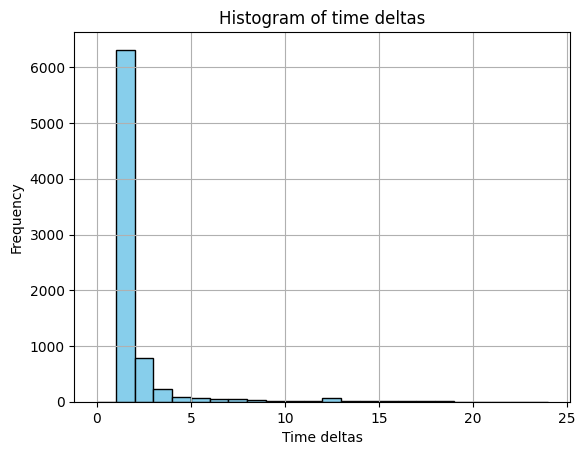

In [85]:
# ub = math.floor(max(time_deltas))
ub = 25
lb = math.ceil(min(time_deltas))

plt.hist(time_deltas, bins=range(lb,ub), color='skyblue', edgecolor='black')
plt.xlabel('Time deltas')
plt.ylabel('Frequency')
plt.title('Histogram of time deltas')
plt.grid(True)
plt.show()

Since most values are 1s apart, let's filter to those

In [91]:
time_deltas_1s = [True if d == 1 else False for d in time_deltas]
pm25_deltas_1s = [i for indx,i in enumerate(pm25_deltas) if time_deltas_1s[indx] == True]

In [94]:
len(pm25_deltas_1s)

6315

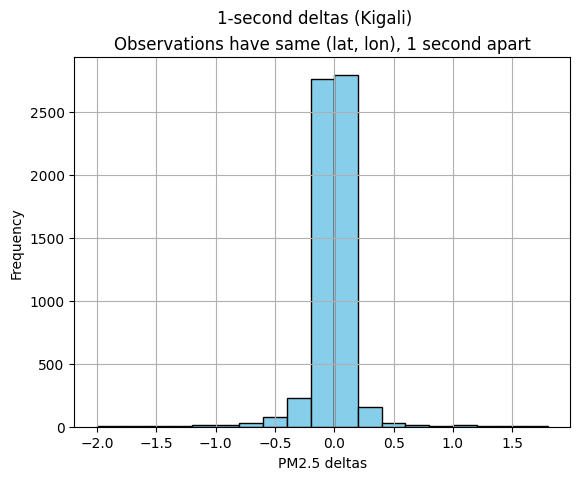

In [101]:
# ub = math.ceil(max(pm25_deltas_1s))
ub = 2
lb = -2
# lb = math.floor(min(pm25_deltas_1s))

plt.hist(pm25_deltas_1s, bins=np.arange(lb,ub, 0.2), color='skyblue', edgecolor='black')
plt.xlabel('PM2.5 deltas')
plt.ylabel('Frequency')
plt.suptitle('1-second deltas (Kigali)')
plt.title("Observations have same (lat, lon), 1 second apart")
plt.grid(True)
plt.show()

### Preprocess Data for GP Workflow

In [87]:
complete_simulation = pd.read_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\complete_simulation.csv")
complete_simulation['time'] =  pd.to_datetime(complete_simulation['time'])

In [98]:
complete_simulation.rename({'measurement':'pm25'}, axis='columns', inplace=True)
complete_simulation.head()

,Unnamed: 0,lat,lon,time,geometry,x,y,pm25
0,0,51.531608,-0.111227,2019-09-20 00:40:46,POINT (531109.3791276133 183101.61512548832),531109.379128,183101.615125,30.055690
1,1,51.531541,-0.111197,2019-09-20 00:40:47,POINT (531111.6238787167 183094.313601551),531111.623879,183094.313602,36.853334
2,2,51.531469,-0.111169,2019-09-20 00:40:48,POINT (531113.7490849497 183086.25776938477),531113.749085,183086.257769,21.454351
3,3,51.531397,-0.111135,2019-09-20 00:40:49,POINT (531116.3127566606 183078.33405932877),531116.312757,183078.334059,20.570919
4,4,51.531324,-0.111104,2019-09-20 00:40:50,POINT (531118.7079703904 183070.34947702457),531118.707970,183070.349477,17.902491


In [102]:
def process_for_gp_flow(df):
    """
    Preprocess the dataframe of observations ahead of the Gaussian processes flow.

    Inputs:
    df: dataframe output of simulate_pollution_geo()

    Outputs:
    df: processed dataframe
    """
    # retain unique entries
    df.drop_duplicates(inplace=True)

    # rename columns
    df.rename({'measurement':'pm25'}, axis='columns', inplace=True)

    # filter to month of interest
    df = df[\
        (df['time'] >= '2019-09-01') &\
        (df['time'] < '2019-10-01')]
    
    # count active drivers
    df['count_drivers'] = df.groupby('time')['time'].transform('count')

    # filter out outliers
    df = df[df['pm25'] <= 500]

    # compute detrended PM2.5 values
    df = rolling_detrend(df)

    return df

In [104]:
def rolling_detrend(df):
    """
    Compute PM2.5 baselines

    Input:
    df: dataframe in preprocessing sequence

    Output:
    df: dataframe with 15-minute, day and combined baselines
    """
    # compute baselines
    df_time = df.set_index('time')
    df_time.sort_index(inplace=True)
    df_time = df_time[['pm25']]
    df_time.drop_duplicates(inplace=True)
    baseline_15_min = df_time.rolling('15min').median()
    baseline_day = df_time.rolling('1D').median()

    # deduplicate times
    dupe_15_i = baseline_15_min.index.duplicated()
    dupe_day_i = baseline_day.index.duplicated()

    baseline_15_min = baseline_15_min[~dupe_15_i] 
    baseline_day = baseline_day[~dupe_day_i]

    # join data and baselines on time indices
    df = df.merge(baseline_15_min
                ,how='left'
                ,left_on='time'
                ,right_index=True
                ,suffixes=(None,'_baseline_15'))
    
    df = df.merge(baseline_day
                  , how='left'
                  , left_on='time'
                  , right_index=True
                  , suffixes=('_original','_baseline_day'))
    
    # subtract baselines from data
    df['pm25_detrended_15'] = df['pm25_original'] - df['pm25_baseline_15']
    df['pm25_detrended_day'] = df['pm25_original'] - df['pm25_baseline_day']
    df['pm25_detrended_comb'] = df['pm25_original'] - 0.5*\
        (df['pm25_baseline_15'] + df['pm25_baseline_day'])
    
    return df

In [105]:
df_gp = process_for_gp_flow(complete_simulation)

In [114]:
df_gp[df_gp['count_drivers']==7].sort_values('time').head()

,Unnamed: 0,lat,lon,time,geometry,x,y,pm25_original,count_drivers,pm25_baseline_15,pm25_baseline_day,pm25_detrended_15,pm25_detrended_day,pm25_detrended_comb
1921863,1921863,51.534144,-0.112582,2019-09-07 03:43:40,POINT (531008.0898835679 183381.21407324006),531008.089884,183381.214073,10.221214,7,13.136235,14.641448,-2.915020,-4.420234,-3.667627
2210440,2210440,51.528854,-0.094076,2019-09-07 03:43:40,POINT (532306.9090708196 182826.22164940945),532306.909071,182826.221649,13.062198,7,13.136235,14.641448,-0.074037,-1.579250,-0.826643
1161135,1161135,51.527453,-0.130547,2019-09-07 03:43:40,POINT (529781.1215577549 182605.20157103537),529781.121558,182605.201571,56.575169,7,13.136235,14.641448,43.438934,41.933721,42.686328
2387394,2387394,51.530940,-0.120356,2019-09-07 03:43:40,POINT (530478.084879676 183011.03528696066),530478.084880,183011.035287,13.815880,7,13.136235,14.641448,0.679645,-0.825568,-0.072961
2185019,2185019,51.529690,-0.115823,2019-09-07 03:43:40,POINT (530796.0558677376 182880.13335330016),530796.055868,182880.133353,12.538182,7,13.136235,14.641448,-0.598053,-2.103266,-1.350659


In [107]:
df_gp.to_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\df_gp.csv", index=False)

## Get Tile IDs per observation

Idea:

* Import raster file of tiles
* Represent each tile by its 'bottom left corner'
* Round every observation to its 'bottom left corner'
* Match tile IDs and observations hereby

In [1]:
# assign an ID to every tile

final_raster_pm25 = pd.read_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\Final_Raster_PM2.5.csv"\
                               , header=None
                               , names=['x', 'y', 'conc'])

final_raster_pm25['tile_id'] = final_raster_pm25.index

NameError: name 'pd' is not defined

In [38]:
# df_gp = pd.read_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\df_gp.csv")
df_gp.drop(['Unnamed: 0.1','Unnamed: 0'], axis=1, inplace=True)

KeyError: "['Unnamed: 0.1', 'Unnamed: 0'] not found in axis"

In [8]:
df_gp.head()

,lat,lon,time,geometry,x,y,pm25_original,count_drivers,pm25_baseline_15,pm25_baseline_day,pm25_detrended_15,pm25_detrended_day,pm25_detrended_comb
0,51.531608,-0.111227,2019-09-20 00:40:46,POINT (531109.3791276133 183101.61512548832),531109.379128,183101.615125,30.055690,2,22.384324,23.656862,7.671367,6.398829,7.035098
1,51.531541,-0.111197,2019-09-20 00:40:47,POINT (531111.6238787167 183094.313601551),531111.623879,183094.313602,36.853334,2,22.388306,23.657489,14.465028,13.195844,13.830436
2,51.531469,-0.111169,2019-09-20 00:40:48,POINT (531113.7490849497 183086.25776938477),531113.749085,183086.257769,21.454351,2,22.389327,23.657552,-0.934976,-2.203201,-1.569089
3,51.531397,-0.111135,2019-09-20 00:40:49,POINT (531116.3127566606 183078.33405932877),531116.312757,183078.334059,20.570919,2,22.388306,23.657552,-1.817387,-3.086633,-2.452010
4,51.531324,-0.111104,2019-09-20 00:40:50,POINT (531118.7079703904 183070.34947702457),531118.707970,183070.349477,17.902491,2,22.379186,23.657552,-4.476695,-5.755062,-5.115878


In [23]:
def get_nearest_tile_ID(bbox, period, point, pm25_raster):
    """
    Retrieve ID of tile centroid nearest to an (x,y) point.
    
    Input:
    bbox: quaple (min_x, min_y, max_x, max_y)
    period: assuming equispaced grid; the # meters between two grid points
    point: (x,y) tuple
    pm25_raster: df containing tile IDs 

    Output:
    grid_centroid: grid point nearest (x,y)
    """
    # unpack tuples
    x,y = point
    min_x, min_y, max_x, max_y = bbox

    # find nearest grid point
    nearest_x, nearest_y = period * round(x/period), period * round(y/period)

    # constrain to bbox
    grid_x = max(min(nearest_x, max_x), min_x)
    grid_y = max(min(nearest_y, max_y), min_y)

    nearest_id = pm25_raster['tile_id'][(pm25_raster['x'] == grid_x) & (pm25_raster['y'] == grid_y)].iloc[0]

    return nearest_id

In [22]:
grid_x, grid_y = 529220.0, 183480.0
final_raster_pm25[(final_raster_pm25['x'] == grid_x) & (final_raster_pm25['y'] == grid_y)]['tile_id'].iloc[0]

0

In [33]:
bbox = (529220.0, 181320.0, 532940.0, 183480.0)
period = 20
df_gp_trim = df_gp.head(1000)

df_gp_trim['tile_id'] = df_gp_trim.progress_apply(lambda row: get_nearest_tile_ID(bbox, period, (row['x'], row['y']), final_raster_pm25), axis=1)

100%|██████████| 1000/1000 [00:00<00:00, 4951.83it/s]
C:\Users\nial\AppData\Local\Temp\ipykernel_1640\3520932985.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gp_trim['tile_id'] = df_gp_trim.progress_apply(lambda row: get_nearest_tile_ID(bbox, period, (row['x'], row['y']), final_raster_pm25), axis=1)


In [29]:
df_gp.head()

,lat,lon,time,geometry,x,y,pm25_original,count_drivers,pm25_baseline_15,pm25_baseline_day,pm25_detrended_15,pm25_detrended_day,pm25_detrended_comb,tile_id
0,51.531608,-0.111227,2019-09-20 00:40:46,POINT (531109.3791276133 183101.61512548832),531109.379128,183101.615125,30.055690,2,22.384324,23.656862,7.671367,6.398829,7.035098,3647
1,51.531541,-0.111197,2019-09-20 00:40:47,POINT (531111.6238787167 183094.313601551),531111.623879,183094.313602,36.853334,2,22.388306,23.657489,14.465028,13.195844,13.830436,3648
2,51.531469,-0.111169,2019-09-20 00:40:48,POINT (531113.7490849497 183086.25776938477),531113.749085,183086.257769,21.454351,2,22.389327,23.657552,-0.934976,-2.203201,-1.569089,3835
3,51.531397,-0.111135,2019-09-20 00:40:49,POINT (531116.3127566606 183078.33405932877),531116.312757,183078.334059,20.570919,2,22.388306,23.657552,-1.817387,-3.086633,-2.452010,3835
4,51.531324,-0.111104,2019-09-20 00:40:50,POINT (531118.7079703904 183070.34947702457),531118.707970,183070.349477,17.902491,2,22.379186,23.657552,-4.476695,-5.755062,-5.115878,3835


In [37]:
df_gp.to_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\df_gp.csv", index=False)

In [36]:
# df_gp = pd.read_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\df_gp.csv")
df_gp.rename({'time':'datetime'}, axis=1, inplace=True)
df_gp.head()

,lat,lon,datetime,geometry,x,y,pm25_original,count_drivers,pm25_baseline_15,pm25_baseline_day,pm25_detrended_15,pm25_detrended_day,pm25_detrended_comb,tile_id
0,51.531608,-0.111227,2019-09-20 00:40:46,POINT (531109.3791276133 183101.61512548832),531109.379128,183101.615125,30.055690,2,22.384324,23.656862,7.671367,6.398829,7.035098,3647
1,51.531541,-0.111197,2019-09-20 00:40:47,POINT (531111.6238787167 183094.313601551),531111.623879,183094.313602,36.853334,2,22.388306,23.657489,14.465028,13.195844,13.830436,3648
2,51.531469,-0.111169,2019-09-20 00:40:48,POINT (531113.7490849497 183086.25776938477),531113.749085,183086.257769,21.454351,2,22.389327,23.657552,-0.934976,-2.203201,-1.569089,3835
3,51.531397,-0.111135,2019-09-20 00:40:49,POINT (531116.3127566606 183078.33405932877),531116.312757,183078.334059,20.570919,2,22.388306,23.657552,-1.817387,-3.086633,-2.452010,3835
4,51.531324,-0.111104,2019-09-20 00:40:50,POINT (531118.7079703904 183070.34947702457),531118.707970,183070.349477,17.902491,2,22.379186,23.657552,-4.476695,-5.755062,-5.115878,3835


### ----------------------  DEPRECATED CODE  ------------------------------------
### -----------------------------------------------------------------------------
### -----------------------------------------------------------------------------
`

#### We should incorporate the data about sensor type

#### Visualize trends in the data

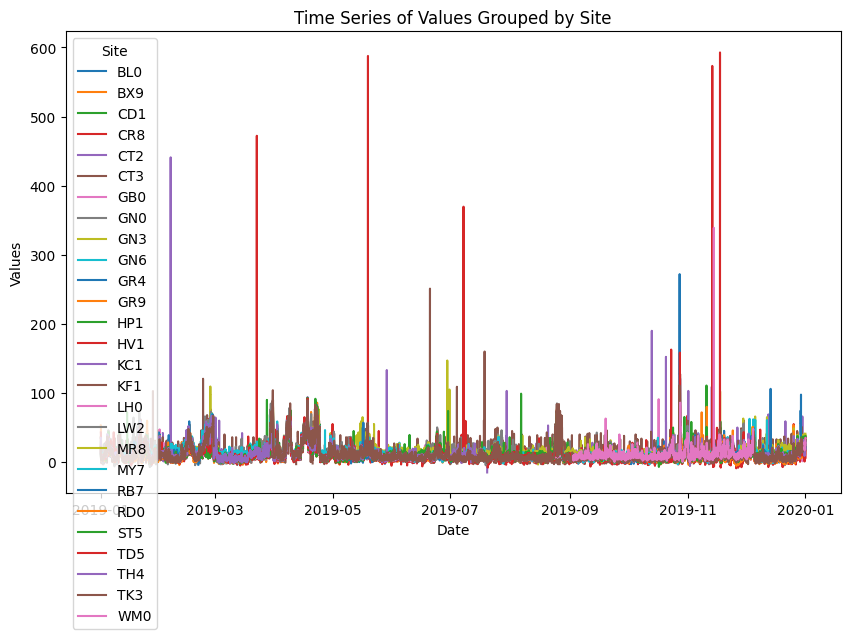

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

for key, grp in frame.groupby('SiteCode'):
    ax.plot(grp['ReadingDateTime'], grp['Value'], label=key)

ax.legend(title='Site')
ax.set_xlabel('Date')
ax.set_ylabel('Values')
ax.set_title('Time Series of Values Grouped by Site')
plt.show()

It is hard to discern anything from this plot. Perhaps we could average all the values by site, then plot the average and see if there is any consistent pattern?

In [ ]:
avg_df = frame.groupby('ReadingDateTime')['Value'].median().reset_index()
count_df = frame.groupby('ReadingDateTime')['Value'].count().reset_index()

In [ ]:
avg_df.head(n=10)

,ReadingDateTime,Value
0,2019-01-01 00:00:00,20.45
1,2019-01-01 00:15:00,20.45
2,2019-01-01 00:30:00,20.95
3,2019-01-01 00:45:00,20.95
4,2019-01-01 01:00:00,11.80
5,2019-01-01 01:15:00,11.65
6,2019-01-01 01:30:00,11.80
7,2019-01-01 01:45:00,11.50
8,2019-01-01 02:00:00,6.70
9,2019-01-01 02:15:00,6.70


In [ ]:
count_df.head(n=10)

,ReadingDateTime,Value
0,2019-01-01 00:00:00,24
1,2019-01-01 00:15:00,24
2,2019-01-01 00:30:00,24
3,2019-01-01 00:45:00,24
4,2019-01-01 01:00:00,24
5,2019-01-01 01:15:00,24
6,2019-01-01 01:30:00,24
7,2019-01-01 01:45:00,24
8,2019-01-01 02:00:00,24
9,2019-01-01 02:15:00,24


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


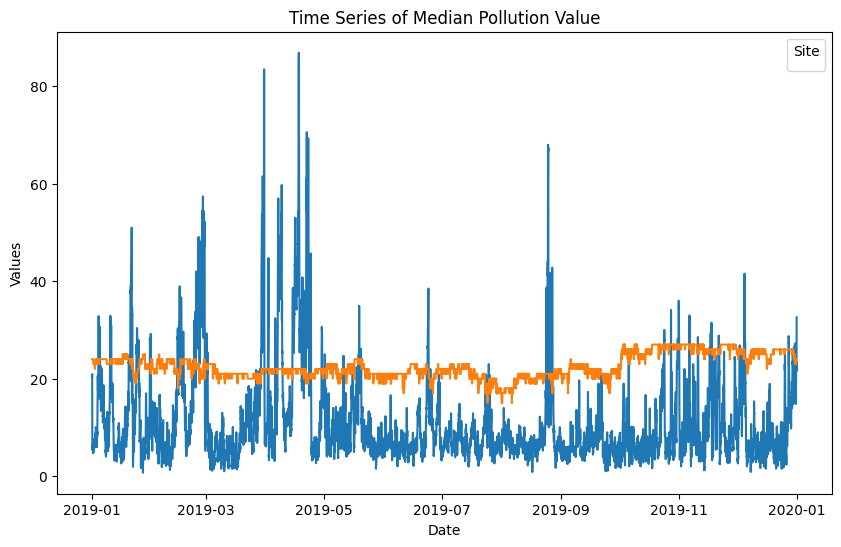

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

ax.plot(avg_df['ReadingDateTime'], avg_df['Value'])
ax.plot(avg_df['ReadingDateTime'], count_df['Value'])
ax.legend(title='Site')
ax.set_xlabel('Date')
ax.set_ylabel('Values')
ax.set_title('Time Series of Median Pollution Value')
plt.show()

#### Plot the average diurnal PM2.5 pattern

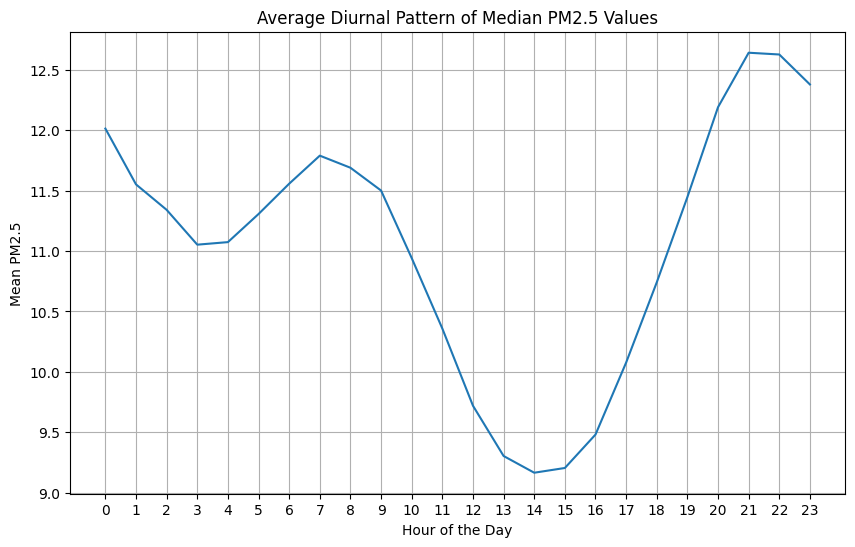

In [ ]:
avg_diurnal = avg_df.groupby(avg_df['ReadingDateTime'].dt.hour)['Value'].mean().reset_index()

plt.figure(figsize=(10, 6))
plt.plot(avg_diurnal['ReadingDateTime'], avg_diurnal['Value'])
plt.xlabel('Hour of the Day')
plt.ylabel('Mean PM2.5')
plt.title('Average Diurnal Pattern of Mean PM2.5 Values')
plt.xticks(range(24))  # Set x-axis ticks to represent each hour
plt.grid(True)
plt.show()

#### Roadside comparison

Perhaps the diurnal cycle of pollution is more pronounced when we look at roadside monitors. The ambient pollution is probably quite stable in London.

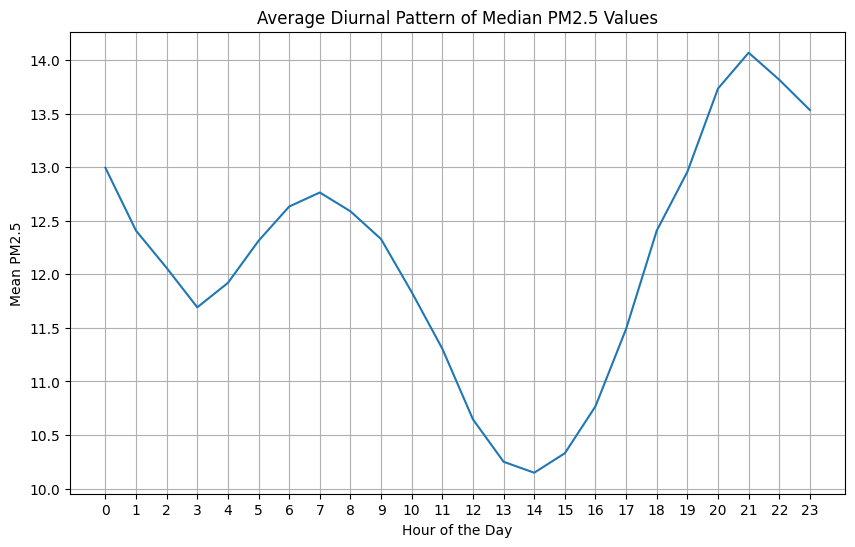

In [ ]:
roadside = frame[frame["Profile"] == "Roadside"]
roadside_diurnal = roadside.groupby(roadside['ReadingDateTime'].dt.hour)['Value'].mean().reset_index()

plt.figure(figsize=(10, 6))
plt.plot(roadside_diurnal['ReadingDateTime'], roadside_diurnal['Value'])
plt.xlabel('Hour of the Day')
plt.ylabel('Mean PM2.5')
plt.title('Average Diurnal Pattern of Mean PM2.5 Values')
plt.xticks(range(24))  # Set x-axis ticks to represent each hour
plt.grid(True)
plt.show()

The diurnal pattern considering only roadside measurements is very similar to that considering all measurements. Though the peak in the evening is slightly more exaggerated. Let's now consider road _and_ kerbside:      

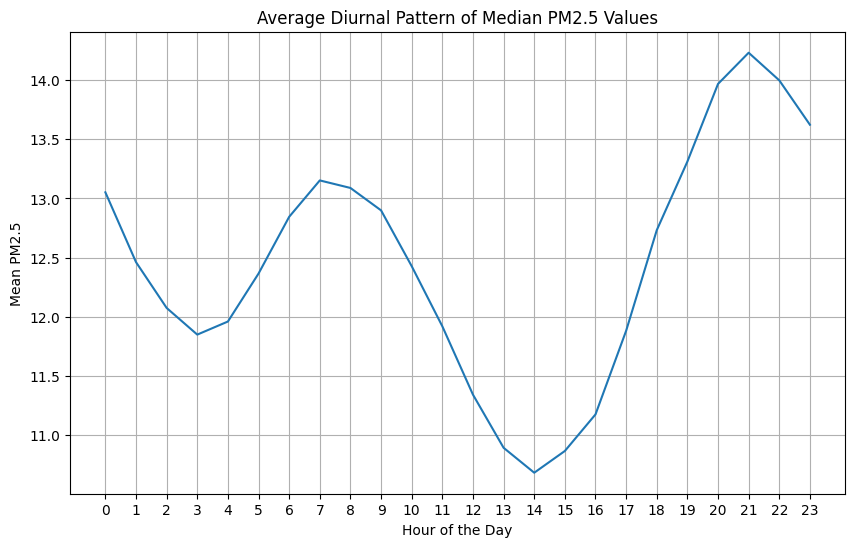

In [ ]:
rk_side = frame[frame["Profile"].isin(["Roadside","Kerbside"])]
rk_side_diurnal = rk_side.groupby(rk_side['ReadingDateTime'].dt.hour)['Value'].mean().reset_index()

plt.figure(figsize=(10, 6))
plt.plot(rk_side_diurnal['ReadingDateTime'], rk_side_diurnal['Value'])
plt.xlabel('Hour of the Day')
plt.ylabel('Mean PM2.5')
plt.title('Average Diurnal Pattern of Mean PM2.5 Values')
plt.xticks(range(24))  # Set x-axis ticks to represent each hour
plt.grid(True)
plt.show()

Basically identical. Let's now look at the pattern of roadside sensor measurements per weekday:

C:\Users\nial\AppData\Local\Temp\ipykernel_21704\3620638968.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roadside["Weekday"] = roadside["ReadingDateTime"].dt.day_name()


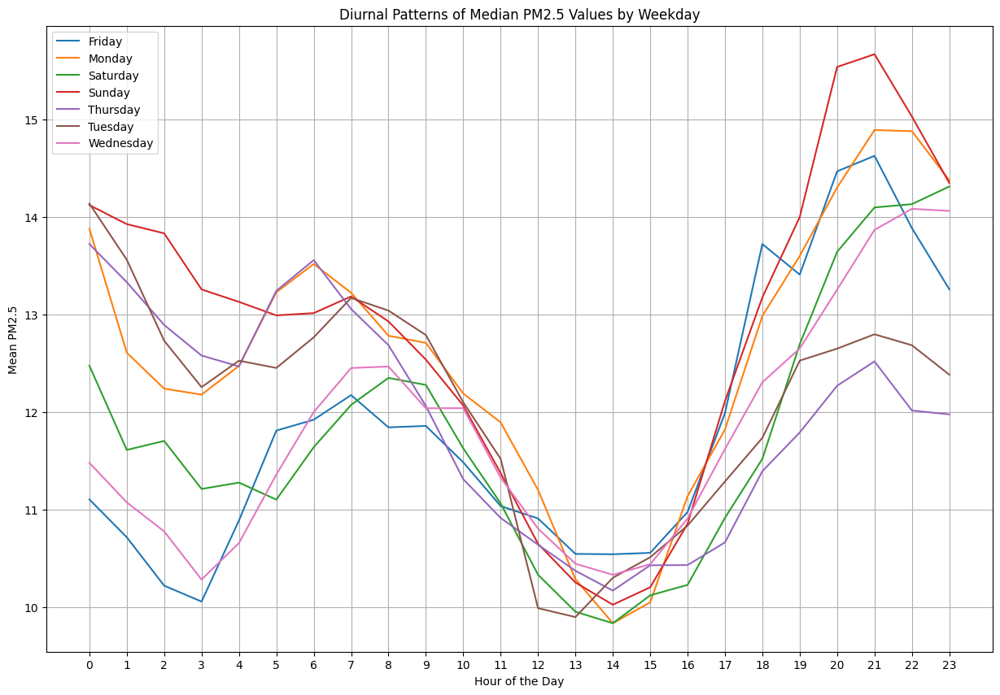

In [ ]:
roadside = frame[frame["Profile"] == "Roadside"]
roadside["Weekday"] = roadside["ReadingDateTime"].dt.day_name()
roadside_diurnal = roadside.groupby(roadside['ReadingDateTime'].dt.hour)['Value'].mean().reset_index()

# Group by weekday and calculate mean
weekday_diurnals = []

for day, group in roadside.groupby('Weekday'):
    diurnal_pattern = group.groupby(group['ReadingDateTime'].dt.hour)['Value'].mean().reset_index()
    weekday_diurnals.append((day, diurnal_pattern))

# Plot each diurnal pattern
plt.figure(figsize=(15, 10))

for day, diurnal_pattern in weekday_diurnals:
    plt.plot(diurnal_pattern['ReadingDateTime'], diurnal_pattern['Value'], label=day)

plt.xlabel('Hour of the Day')
plt.ylabel('Mean PM2.5')
plt.title('Diurnal Patterns of Mean PM2.5 Values by Weekday')
plt.xticks(range(24))  # Set x-axis ticks to represent each hour
plt.legend()
plt.grid(True)
plt.show()

Weekday does not seem to make a huge difference. How about season?

C:\Users\nial\AppData\Local\Temp\ipykernel_21704\1107681082.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roadside['Season'] = roadside['ReadingDateTime'].dt.month.map(determine_season)


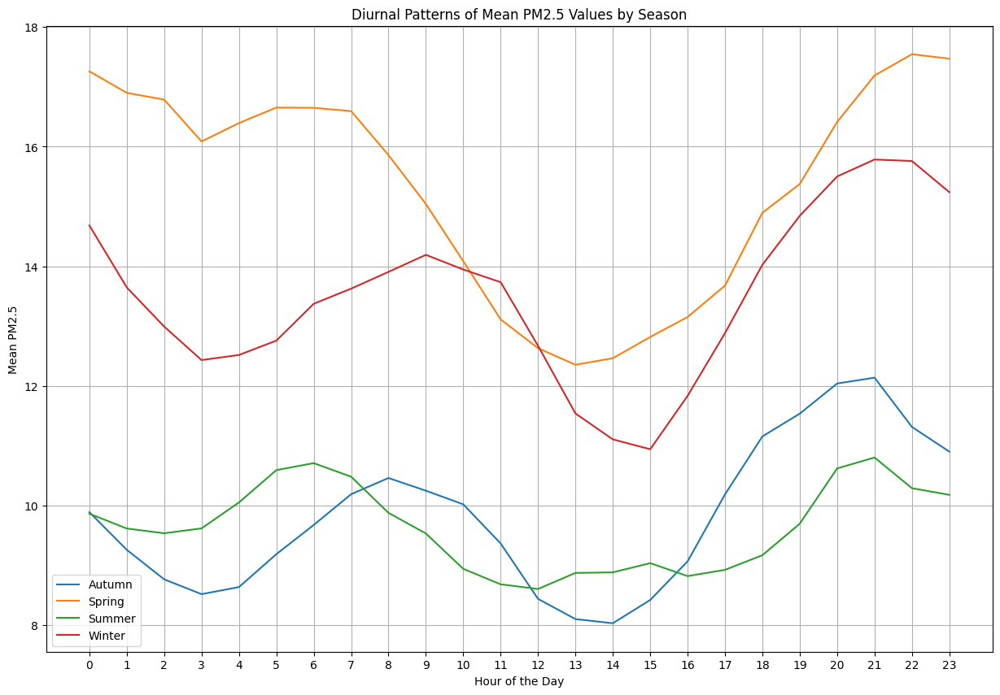

In [ ]:
# Determine the season for each measurement
def determine_season(month):
    if 3 <= month <= 5:
        return 'Spring'
    elif 6 <= month <= 8:
        return 'Summer'
    elif 9 <= month <= 11:
        return 'Autumn'
    else:
        return 'Winter'

roadside['Season'] = roadside['ReadingDateTime'].dt.month.map(determine_season)

# Group by season and calculate mean
season_diurnals = []

for season, group in roadside.groupby('Season'):
    diurnal_pattern = group.groupby(group['ReadingDateTime'].dt.hour)['Value'].mean().reset_index()
    season_diurnals.append((season, diurnal_pattern))

# Plot diurnal patterns for each season
plt.figure(figsize=(15, 10))

for season, diurnal_pattern in season_diurnals:
    plt.plot(diurnal_pattern['ReadingDateTime'], diurnal_pattern['Value'], label=season)

plt.xlabel('Hour of the Day')
plt.ylabel('Mean PM2.5')
plt.title('Diurnal Patterns of Mean PM2.5 Values by Season')
plt.xticks(range(24))  # Set x-axis ticks to represent each hour
plt.legend()
plt.grid(True)
plt.show()

To conclude, visual inspection suggests that there are hourly and seasonal trends in London's on-road PM2.5 concentrations. We now want to generate temporal data by applying the trends as a scaling factor to the static spatial data. Before that though, we should define a spatial bounding box so as to reduce the spatial area of interest (and thus the computational burden of the simulation).

#### Defining spatial extent

In [ ]:
df_2019 = pd.read_csv(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\LAEI_2019_PM25_Predictions.csv"
                    , header=0
                    , delimiter=',')

In [ ]:
df_2019.head()

,x,y,conc
0,519100,203440,9.567125
1,519120,203440,9.687501
2,519140,203440,9.953107
3,519160,203440,9.791943
4,519180,203440,9.635820


In [ ]:
df_2019["x"].min(), df_2019["x"].max()

(501480, 561980)

In [ ]:
df_2019["y"].min(), df_2019["y"].max() 

(152360, 203440)

In [51]:
gpkg_path = r'C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\Final_Roads.gpkg'

# Read the GeoPackage layer into a GeoDataFrame
gdf = gpd.read_file(gpkg_path)

# Display the GeoDataFrame
print(gdf.head())

    full_id   osm_id osm_type       highway ref:bag   bin internal  \
0    w31030    31030      way       primary    None  None     None   
1    w31039    31039      way       primary    None  None     None   
2   w330437   330437      way       primary    None  None     None   
3   w331680   331680      way       primary    None  None     None   
4  w2415108  2415108      way  unclassified    None  None     None   

  cycleway:separation locked cycleway:both:width  ... parking:both  \
0                None   None                None  ...           no   
1                None   None                None  ...         None   
2                None   None                None  ...         None   
3                None   None                None  ...         None   
4                None   None                None  ...         None   

  operator:wikidata              operator oneway                  name  \
0           Q682520  Transport for London    yes           Grafton Way   
1         

516 columns is excessive, let's cut that down.

In [61]:
cols = ["full_id","highway","name","geometry"]

gdf_cut = gdf[cols]

In [62]:
gdf_cut.head()

,full_id,highway,name,geometry
0,w31030,primary,Grafton Way,"MULTILINESTRING ((529484.479 182279.813, 52947..."
1,w31039,primary,Tottenham Court Road,"MULTILINESTRING ((529823.089 181377.825, 52982..."
2,w330437,primary,St. John Street,"MULTILINESTRING ((531450.672 183143.727, 53145..."
3,w331680,primary,East Road,"MULTILINESTRING ((532837.992 183102.744, 53283..."
4,w2415108,unclassified,Saint Peter's Street,"MULTILINESTRING ((532101.632 183253.141, 53209..."


For posterity:

In [63]:
output_file = r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\Final_Roads_Small"
gdf_cut.to_file(output_file, driver="GPKG")

Visualize the roads

<Axes: >

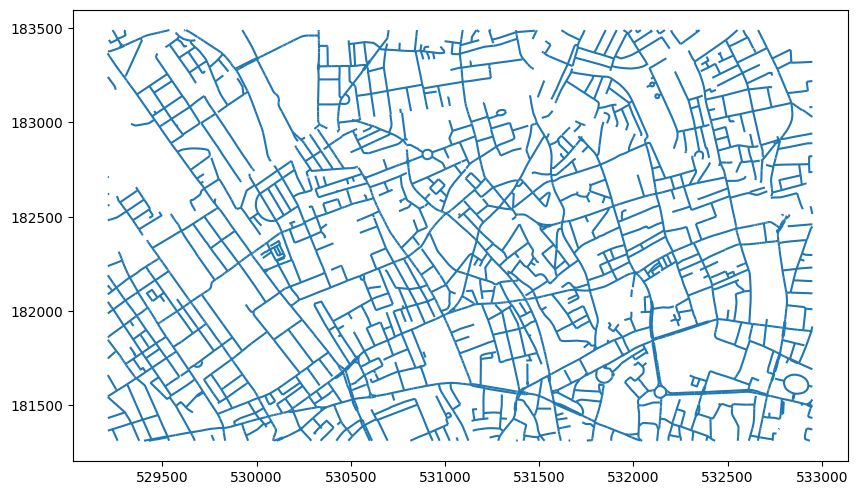

In [64]:
gdf_cut.plot(figsize=(10,10))

#### Re-load the saved GeoDF

In [2]:
output_file = r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\Final_Roads_Small"
gdf_cut = gpd.read_file(output_file)

In [3]:
gdf_cut.head()

,full_id,highway,name,geometry
0,w31030,primary,Grafton Way,"MULTILINESTRING ((529484.479 182279.813, 52947..."
1,w31039,primary,Tottenham Court Road,"MULTILINESTRING ((529823.089 181377.825, 52982..."
2,w330437,primary,St. John Street,"MULTILINESTRING ((531450.672 183143.727, 53145..."
3,w331680,primary,East Road,"MULTILINESTRING ((532837.992 183102.744, 53283..."
4,w2415108,unclassified,Saint Peter's Street,"MULTILINESTRING ((532101.632 183253.141, 53209..."


In [20]:
gdf_lat_lon = gdf_cut.to_crs('epsg:4326')

In [8]:
way_ids = [int(way_id[1:]) for way_id in gdf_cut["full_id"]]
way_ids

[31030,
 31039,
 330437,
 331680,
 2415108,
 2417071,
 2425193,
 2430840,
 2483764,
 2483868,
 2483869,
 2483870,
 2495401,
 2498957,
 2498964,
 2498965,
 2498997,
 2499055,
 2499080,
 2499081,
 2514019,
 2514020,
 2514025,
 2558884,
 2587700,
 2592180,
 2592181,
 2592182,
 2592183,
 2631259,
 2631515,
 2631517,
 2631518,
 2631519,
 2644235,
 2644236,
 2644237,
 2644707,
 2644765,
 2644766,
 2793132,
 2831540,
 2837144,
 2850776,
 2876126,
 2876128,
 2876129,
 2876427,
 2876428,
 2876551,
 2876710,
 2876749,
 2876891,
 2876892,
 2876904,
 2876973,
 2915985,
 2953548,
 2953567,
 3076611,
 3076785,
 3076825,
 3076826,
 3076827,
 3076841,
 3076852,
 3087448,
 3087449,
 3087832,
 3088166,
 3088286,
 3088642,
 3097584,
 3097607,
 3097621,
 3098814,
 3098816,
 3100051,
 3127736,
 3127740,
 3128255,
 3128349,
 3241247,
 3241842,
 3284233,
 3318926,
 3318947,
 3319515,
 3319517,
 3319600,
 3700585,
 3713102,
 3713821,
 3713822,
 3754017,
 3754020,
 3754021,
 3754025,
 3754026,
 3754068,
 37540

In [22]:
min_x, min_y, max_x, max_y = gdf_lat_lon.total_bounds

In [35]:
query = """
[out:json];
[bbox:{}, {}, {}, {}];
node;
""".format(min_y, min_x, max_y, max_x)

In [48]:
query = """
[out:json];
node({}, {}, {}, {});
out;
""".format(min_y, min_x, max_y, max_x)

In [41]:
query

'\n[out:json];\nnode(-0.13923065419845002, 51.51508053437111, -0.08462385048258105, 51.535529601899);\n'

In [49]:
overpass_url =  r"https://overpass-api.de/api/interpreter"
params = {'data':query}
response=requests.post(overpass_url, data=params)

In [51]:
london_nodes = response.json()

In [54]:
elements = london_nodes.get('elements', [])

In [58]:
elements

[{'type': 'node', 'id': 104302, 'lat': 51.5203679, 'lon': -0.1303251},
 {'type': 'node', 'id': 104305, 'lat': 51.5239463, 'lon': -0.1209774},
 {'type': 'node', 'id': 104309, 'lat': 51.5234828, 'lon': -0.1149355},
 {'type': 'node', 'id': 104310, 'lat': 51.5229862, 'lon': -0.1145024},
 {'type': 'node', 'id': 104312, 'lat': 51.5215137, 'lon': -0.11332},
 {'type': 'node', 'id': 104313, 'lat': 51.5202115, 'lon': -0.1124636},
 {'type': 'node', 'id': 104314, 'lat': 51.5190742, 'lon': -0.1118044},
 {'type': 'node', 'id': 104315, 'lat': 51.5181757, 'lon': -0.1113814},
 {'type': 'node', 'id': 104316, 'lat': 51.5178784, 'lon': -0.1085377},
 {'type': 'node', 'id': 104318, 'lat': 51.5162301, 'lon': -0.1019241},
 {'type': 'node',
  'id': 104319,
  'lat': 51.5153718,
  'lon': -0.0988079,
  'tags': {'button_operated': 'yes',
   'crossing': 'traffic_signals',
   'highway': 'crossing',
   'tactile_paving': 'yes',
   'traffic_signals:sound': 'no',
   'traffic_signals:vibration': 'yes'}},
 {'type': 'node'

In [59]:
ldn_node_df = gpd.GeoDataFrame(elements
                       , geometry=gpd.points_from_xy([elem['lon'] for elem in elements]
                                                     , [elem['lat'] for elem in elements]))

In [64]:
ldn_node_df.drop('tags', axis=1, inplace=True)

For posterity :)

In [66]:
output_nodes = r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI\london_nodes.gpkg"
gdf_cut.to_file(output_nodes, driver="GPKG")

In [ ]:
G = osm.to_graph(ldn_node_df, lon)